# Cross-Tokenizer Token Commonality Analysis

This notebook analyzes English, Indic, Code, and JSON tokens across multiple LLM tokenizers to find common vocabulary patterns and token position consistency.

## Tokenizers Analyzed
| Model | Description |
|-------|-------------|
| ByteD | ByteDance tokenizer |
| DeepSeek | DeepSeek V3 tokenizer |
| DeepSeek Coder | DeepSeek Coder tokenizer |
| GPT-OSS | OpenAI-style tokenizer |
| Mistral | Mistral AI tokenizer |
| OLMo | AI2 OLMo tokenizer |
| OLMo Code | AI2 OLMo Code tokenizer |
| Qwen | Alibaba Qwen tokenizer |
| Qwen Code | Alibaba Qwen Code tokenizer |
| Gemma | Google Gemma tokenizer |

In [1]:
# Cell 1: Imports and Setup
import json
import re
import os
from pathlib import Path
from collections import defaultdict
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Set up paths
DATA_DIR = Path("data")
OUTPUT_DIR = Path("output")
CHARTS_DIR = Path("charts")

# Ensure output directories exist
OUTPUT_DIR.mkdir(exist_ok=True)
CHARTS_DIR.mkdir(exist_ok=True)

# Define tokenizer files
TOKENIZER_FILES = {
    'ByteD': 'byted_tokenizer.json',
    'DeepSeek': 'ds_tokenizer.json',
    'DSCoder': 'dscode_tokenizer.json',
    'GPT-OSS': 'gptoss_tokenizer.json',
    'Mistral': 'mistral_tokenizer.json',
    'OLMo': 'olmo_tokenizer.json',
    'OLMoCode': 'olmocode_tokenizer.json',
    'Qwen': 'qwen_tokenizer.json',
    'QwenCode': 'qwencode_tokenizer.json',
    'Gemma': 'gemma_tokenizer.json'
}

MODEL_ORDER = list(TOKENIZER_FILES.keys())

print(f"Data directory: {DATA_DIR}")
print(f"Output directory: {OUTPUT_DIR}")
print(f"Charts directory: {CHARTS_DIR}")
print(f"\nTokenizers to analyze: {len(TOKENIZER_FILES)}")
for name in MODEL_ORDER:
    print(f"  - {name}")

Data directory: data
Output directory: output
Charts directory: charts

Tokenizers to analyze: 10
  - ByteD
  - DeepSeek
  - DSCoder
  - GPT-OSS
  - Mistral
  - OLMo
  - OLMoCode
  - Qwen
  - QwenCode
  - Gemma


## Helper Functions

Core functions for token decoding and language classification.

In [2]:
# Cell 2: Byte Decoder and Token Decoding Functions

def create_byte_decoder():
    """Create GPT-2 style byte decoder mapping."""
    bs = list(range(ord("!"), ord("~")+1)) + list(range(ord("¡"), ord("¬")+1)) + list(range(ord("®"), ord("ÿ")+1))
    cs = bs[:]
    n = 0
    for b in range(2**8):
        if b not in bs:
            bs.append(b)
            cs.append(2**8 + n)
            n += 1
    return {chr(c): b for b, c in zip(bs, cs)}

BYTE_DECODER = create_byte_decoder()

def decode_bpe_token(token):
    """Decode a BPE token to its actual string representation."""
    try:
        decoded_bytes = bytes([BYTE_DECODER.get(c, ord(c)) for c in token])
        return decoded_bytes.decode('utf-8', errors='replace')
    except:
        return token

def get_token_length(token):
    """Get the actual character length of a token after decoding."""
    decoded = decode_bpe_token(token)
    return len(decoded)

print("Byte decoder created successfully.")
print(f"Decoder mapping size: {len(BYTE_DECODER)}")

Byte decoder created successfully.
Decoder mapping size: 256


In [3]:
# Cell 3: Language Classification Functions

# Unicode ranges for Indic scripts
INDIC_RANGES = {
    'Devanagari': (0x0900, 0x097F),
    'Bengali': (0x0980, 0x09FF),
    'Gurmukhi': (0x0A00, 0x0A7F),
    'Gujarati': (0x0A80, 0x0AFF),
    'Odia': (0x0B00, 0x0B7F),
    'Tamil': (0x0B80, 0x0BFF),
    'Telugu': (0x0C00, 0x0C7F),
    'Kannada': (0x0C80, 0x0CFF),
    'Malayalam': (0x0D00, 0x0D7F),
    'Sinhala': (0x0D80, 0x0DFF),
}

def is_english_token(text):
    """Check if token is primarily English (Latin ASCII with common punctuation)."""
    if not text or len(text.strip()) == 0:
        return False
    clean = text.strip()
    if not clean:
        return False
    # Check if mostly ASCII letters/numbers with some punctuation
    ascii_chars = sum(1 for c in clean if ord(c) < 128 and (c.isalpha() or c.isdigit() or c in "'-"))
    total_alpha = sum(1 for c in clean if c.isalpha() or c.isdigit())
    if total_alpha == 0:
        return False
    return ascii_chars / max(len(clean), 1) > 0.7

def classify_indic_script(text):
    """Classify text by Indic script. Returns script name or None."""
    script_counts = defaultdict(int)
    for char in text:
        code = ord(char)
        for script, (start, end) in INDIC_RANGES.items():
            if start <= code <= end:
                script_counts[script] += 1
                break
    
    if script_counts:
        return max(script_counts.items(), key=lambda x: x[1])[0]
    return None

def is_code_token(token):
    """Check if token is related to programming/code."""
    decoded = decode_bpe_token(token).strip()
    
    # Code-related patterns
    code_patterns = [
        r'^(def|class|function|const|let|var|import|from|return|if|else|elif|for|while|try|except|catch|finally|async|await|yield|lambda|public|private|protected|static|void|int|float|double|string|bool|null|None|true|false|True|False|undefined|this|self|super|new|delete|throw|throws|extends|implements|interface|abstract|virtual|override|final|package|namespace|using|include|require|export|module)$',
        r'^(console|print|printf|println|log|debug|error|warn|info)$',
        r'^(Array|List|Dict|Map|Set|Object|String|Number|Boolean|Function|Promise|Observable)$',
        r'^\s*(//|#|/\*|\*/|<!--|-->)',  # Comments
        r'^[{}\[\]();,.]$',  # Brackets and punctuation
        r'^(=>|->|::|&&|\|\||==|!=|<=|>=|\+=|-=|\*=|/=)$',  # Operators
        r'^__(init|main|name|str|repr|len|iter|next|call|getattr|setattr)__$',  # Python dunder
        r'^(GET|POST|PUT|DELETE|PATCH|HTTP|API|REST|GraphQL)$',  # API related
        r'^(SELECT|INSERT|UPDATE|DELETE|FROM|WHERE|JOIN|ORDER|GROUP|BY|AND|OR|NOT|CREATE|DROP|TABLE|INDEX)$',  # SQL
    ]
    
    for pattern in code_patterns:
        if re.search(pattern, decoded, re.IGNORECASE):
            return True
    
    # Check for camelCase or snake_case patterns
    if re.match(r'^[a-z]+[A-Z][a-zA-Z]*$', decoded):  # camelCase
        return True
    if re.match(r'^[a-z]+(_[a-z]+)+$', decoded):  # snake_case
        return True
    
    return False

def is_json_token(token):
    """Check if token is related to JSON handling."""
    decoded = decode_bpe_token(token).strip()
    
    json_patterns = [
        r'^[{}\[\]:,]$',  # JSON structural characters
        r'^"[^"]*"$',  # Quoted strings
        r'^(true|false|null)$',  # JSON literals
        r'^\s*(json|JSON|Json)$',
        r'^\s*(stringify|parse|dumps|loads|serialize|deserialize)$',
    ]
    
    for pattern in json_patterns:
        if re.search(pattern, decoded, re.IGNORECASE):
            return True
    
    return False

def classify_token_language(text):
    """
    Classify a token's language/script.
    Returns: (category, is_english_or_indic)
    Categories: 'English', 'Code', 'JSON', or Indic script name, or None
    """
    if not text or len(text.strip()) == 0:
        return None, False
    
    clean = text.strip()
    
    # Check for Indic scripts first
    indic_script = classify_indic_script(clean)
    if indic_script:
        return indic_script, True
    
    # Check for English
    if is_english_token(clean):
        return 'English', True
    
    return None, False

def normalize_token(token):
    """
    Normalize token for comparison across tokenizers.
    - Strips leading/trailing whitespace markers
    - Converts to lowercase for matching
    """
    decoded = decode_bpe_token(token)
    normalized = decoded.strip()
    
    # Remove leading space markers
    if normalized.startswith('Ġ'):
        normalized = normalized[1:]
    if normalized.startswith('▁'):  # SentencePiece style
        normalized = normalized[1:]
    if normalized.startswith(' '):
        normalized = normalized[1:]
    
    return normalized.lower(), decoded

print("Language classification functions loaded.")
print(f"Indic scripts supported: {list(INDIC_RANGES.keys())}")

Language classification functions loaded.
Indic scripts supported: ['Devanagari', 'Bengali', 'Gurmukhi', 'Gujarati', 'Odia', 'Tamil', 'Telugu', 'Kannada', 'Malayalam', 'Sinhala']


## Load All Tokenizers and Extract Vocabulary

In [4]:
# Cell 4: Load All Tokenizers

tokenizer_vocabs = {}
vocab_sizes = {}

print("Loading tokenizers...")
print("=" * 60)

for name, filename in TOKENIZER_FILES.items():
    filepath = DATA_DIR / filename
    
    if not filepath.exists():
        print(f"  ⚠️  {name}: File not found - {filename}")
        continue
    
    try:
        with open(filepath, 'r', encoding='utf-8') as f:
            data = json.load(f)
        
        # Extract vocabulary (token -> id mapping)
        vocab = data.get('model', {}).get('vocab', {})
        tokenizer_vocabs[name] = vocab
        vocab_sizes[name] = len(vocab)
        print(f"  ✓ {name}: {len(vocab):,} tokens")
    except Exception as e:
        print(f"  ✗ {name}: Error loading - {e}")

print("=" * 60)
print(f"Total tokenizers loaded: {len(tokenizer_vocabs)}")

# Update MODEL_ORDER to only include loaded tokenizers
MODEL_ORDER = [m for m in MODEL_ORDER if m in tokenizer_vocabs]
print(f"Models available for analysis: {MODEL_ORDER}")

Loading tokenizers...
  ✓ ByteD: 155,121 tokens
  ✓ DeepSeek: 128,000 tokens
  ✓ DSCoder: 32,000 tokens
  ✓ GPT-OSS: 199,998 tokens
  ✓ Mistral: 131,072 tokens
  ✓ OLMo: 100,278 tokens
  ✓ OLMoCode: 151,643 tokens
  ✓ Qwen: 151,643 tokens
  ✓ QwenCode: 151,643 tokens
  ✓ Gemma: 255,998 tokens
Total tokenizers loaded: 10
Models available for analysis: ['ByteD', 'DeepSeek', 'DSCoder', 'GPT-OSS', 'Mistral', 'OLMo', 'OLMoCode', 'Qwen', 'QwenCode', 'Gemma']


## Extract and Classify Tokens

Build a token registry with normalized tokens mapped to their occurrences across all models.

In [5]:
# Cell 5: Extract and Classify Tokens

# Token registry: normalized_token -> {model: {raw_token, token_id, decoded, category, normalized_id}}
token_registry = defaultdict(dict)

# Statistics per model
model_stats = {}

print("Extracting and classifying tokens...")
print("=" * 70)

for model_name, vocab in tokenizer_vocabs.items():
    vocab_size = len(vocab)
    english_count = 0
    indic_count = 0
    code_count = 0
    json_count = 0
    
    for raw_token, token_id in vocab.items():
        # Normalize and decode
        normalized, decoded = normalize_token(raw_token)
        
        # Skip very short tokens (single chars) and empty
        if len(normalized) < 2:
            continue
        
        # Classify the token
        category, is_valid = classify_token_language(decoded)
        
        # Also check for code/JSON tokens
        is_code = is_code_token(raw_token)
        is_json = is_json_token(raw_token)
        
        if is_code:
            code_count += 1
        if is_json:
            json_count += 1
        
        if is_valid and category:
            token_registry[normalized][model_name] = {
                'raw_token': raw_token,
                'token_id': token_id,
                'decoded': decoded,
                'category': category,
                'normalized_id': token_id / vocab_size,  # 0-1 scale
                'is_code': is_code,
                'is_json': is_json
            }
            
            if category == 'English':
                english_count += 1
            else:
                indic_count += 1
    
    model_stats[model_name] = {
        'vocab_size': vocab_size,
        'english': english_count,
        'indic': indic_count,
        'code': code_count,
        'json': json_count
    }
    
    print(f"{model_name:12}: {english_count:>7,} English | {indic_count:>6,} Indic | {code_count:>5,} Code | {json_count:>4,} JSON")

print("=" * 70)
print(f"Total unique normalized tokens: {len(token_registry):,}")

Extracting and classifying tokens...
ByteD       :  77,270 English |  1,814 Indic |   953 Code |   50 JSON
DeepSeek    :  69,960 English |  1,230 Indic |   785 Code |   41 JSON
DSCoder     :  23,553 English |      0 Indic |   521 Code |   33 JSON
GPT-OSS     : 128,170 English | 12,787 Indic |   954 Code |   92 JSON
Mistral     :  83,891 English |  4,549 Indic |   648 Code |   50 JSON
OLMo        :  87,409 English |     11 Indic | 2,936 Code |  106 JSON
OLMoCode    :  88,762 English |     11 Indic | 2,938 Code |  106 JSON
Qwen        :  88,762 English |     11 Indic | 2,938 Code |  106 JSON
QwenCode    :  88,762 English |     11 Indic | 2,938 Code |  106 JSON
Gemma       : 174,153 English |  2,169 Indic | 2,516 Code |   42 JSON
Total unique normalized tokens: 160,457


## Build Cross-Tokenizer Comparison Table

In [6]:
# Cell 6: Build Comprehensive Cross-Tokenizer Table

rows = []

for normalized_token, model_data in token_registry.items():
    row = {
        'normalized_token': normalized_token,
        'model_count': len(model_data)
    }
    
    # Determine primary category (most common across models)
    categories = [d['category'] for d in model_data.values()]
    row['category'] = max(set(categories), key=categories.count)
    
    # Check if any model marks this as code/json
    row['is_code'] = any(d.get('is_code', False) for d in model_data.values())
    row['is_json'] = any(d.get('is_json', False) for d in model_data.values())
    
    normalized_ids = []
    
    # Add columns for each model
    for model in MODEL_ORDER:
        if model in model_data:
            data = model_data[model]
            row[f'{model}_token'] = data['decoded']
            row[f'{model}_token_id'] = data['token_id']
            row[f'{model}_norm_id'] = data['normalized_id']
            normalized_ids.append(data['normalized_id'])
        else:
            row[f'{model}_token'] = None
            row[f'{model}_token_id'] = None
            row[f'{model}_norm_id'] = None
    
    # Calculate min/max normalized IDs
    if normalized_ids:
        row['min_norm_id'] = min(normalized_ids)
        row['max_norm_id'] = max(normalized_ids)
        row['norm_id_range'] = max(normalized_ids) - min(normalized_ids)
        row['avg_norm_id'] = np.mean(normalized_ids)
    else:
        row['min_norm_id'] = None
        row['max_norm_id'] = None
        row['norm_id_range'] = None
        row['avg_norm_id'] = None
    
    rows.append(row)

# Create DataFrame
df = pd.DataFrame(rows)

print(f"Total rows in table: {len(df):,}")
print(f"\nModel count distribution:")
print(df['model_count'].value_counts().sort_index(ascending=False))

Total rows in table: 160,457

Model count distribution:
model_count
10    12724
9     12999
8      6819
7      4199
6      4661
5     12254
4     11764
3     12970
2     19433
1     62634
Name: count, dtype: int64


## Sort by Commonality and Importance

In [7]:
# Cell 7: Sort by Commonality and Importance

# Sort by:
# 1. Model count (descending) - tokens in more models are more common/important
# 2. Average normalized ID (ascending) - lower IDs = more frequent tokens in training
# 3. Norm ID range (ascending) - consistent ranking across models

df_sorted = df.sort_values(
    by=['model_count', 'avg_norm_id', 'norm_id_range'],
    ascending=[False, True, True]
).reset_index(drop=True)

# Add importance rank
df_sorted['importance_rank'] = df_sorted.index + 1

print("Top 30 most common tokens across all models:")
display_cols = ['importance_rank', 'normalized_token', 'category', 'model_count', 
                'avg_norm_id', 'min_norm_id', 'max_norm_id', 'is_code', 'is_json']
print(df_sorted[display_cols].head(30).to_string(index=False))

Top 30 most common tokens across all models:
 importance_rank normalized_token category  model_count  avg_norm_id  min_norm_id  max_norm_id  is_code  is_json
               1             ault  English           10     0.017353     0.006232     0.052125    False    False
               2              ght  English           10     0.017564     0.003184     0.041219    False    False
               3             raph  English           10     0.019839     0.011242     0.059406    False    False
               4           ording  English           10     0.027664     0.011508     0.085187    False    False
               5           urther  English           10     0.032247     0.012578     0.086094    False    False
               6             ided  English           10     0.037797     0.021970     0.070594    False    False
               7           lation  English           10     0.038041     0.010539     0.118308    False    False
               8           atures  English         

## View Tokens by Category

In [8]:
# Cell 8: Category Distribution and Top Tokens

# Category breakdown
print("=" * 80)
print("CATEGORY DISTRIBUTION")
print("=" * 80)
print(df_sorted['category'].value_counts())

# Top English tokens
print("\n" + "=" * 80)
print("TOP 20 ENGLISH TOKENS (found in most models)")
print("=" * 80)
english_df = df_sorted[df_sorted['category'] == 'English']
print(english_df[display_cols].head(20).to_string(index=False))

# Top Indic tokens
print("\n" + "=" * 80)
print("TOP 20 INDIC TOKENS (found in most models)")
print("=" * 80)
indic_df = df_sorted[df_sorted['category'] != 'English']
print(indic_df[display_cols].head(20).to_string(index=False))

# Code tokens
print("\n" + "=" * 80)
print("TOP 20 CODE-RELATED TOKENS")
print("=" * 80)
code_df = df_sorted[df_sorted['is_code'] == True]
print(f"Total code tokens: {len(code_df):,}")
print(code_df[display_cols].head(20).to_string(index=False))

# JSON tokens
print("\n" + "=" * 80)
print("TOP 20 JSON-RELATED TOKENS")
print("=" * 80)
json_df = df_sorted[df_sorted['is_json'] == True]
print(f"Total JSON tokens: {len(json_df):,}")
print(json_df[display_cols].head(20).to_string(index=False))

CATEGORY DISTRIBUTION
category
English       146855
Devanagari      3902
Bengali         2087
Telugu          1685
Malayalam       1607
Gujarati        1455
Kannada         1237
Tamil           1112
Sinhala          293
Gurmukhi         218
Odia               6
Name: count, dtype: int64

TOP 20 ENGLISH TOKENS (found in most models)
 importance_rank normalized_token category  model_count  avg_norm_id  min_norm_id  max_norm_id  is_code  is_json
               1             ault  English           10     0.017353     0.006232     0.052125    False    False
               2              ght  English           10     0.017564     0.003184     0.041219    False    False
               3             raph  English           10     0.019839     0.011242     0.059406    False    False
               4           ording  English           10     0.027664     0.011508     0.085187    False    False
               5           urther  English           10     0.032247     0.012578     0.086094    Fal

## Visualize Token Position Consistency Across Models

Analyze whether tokens found in multiple models have similar relative positions (normalized token IDs).

Analyzing tokens in 5+ models: 53,656 tokens


C:\Users\vinojos\AppData\Local\Temp\ipykernel_42528\3188058753.py:76: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax4.boxplot(box_data, labels=box_labels, patch_artist=True)


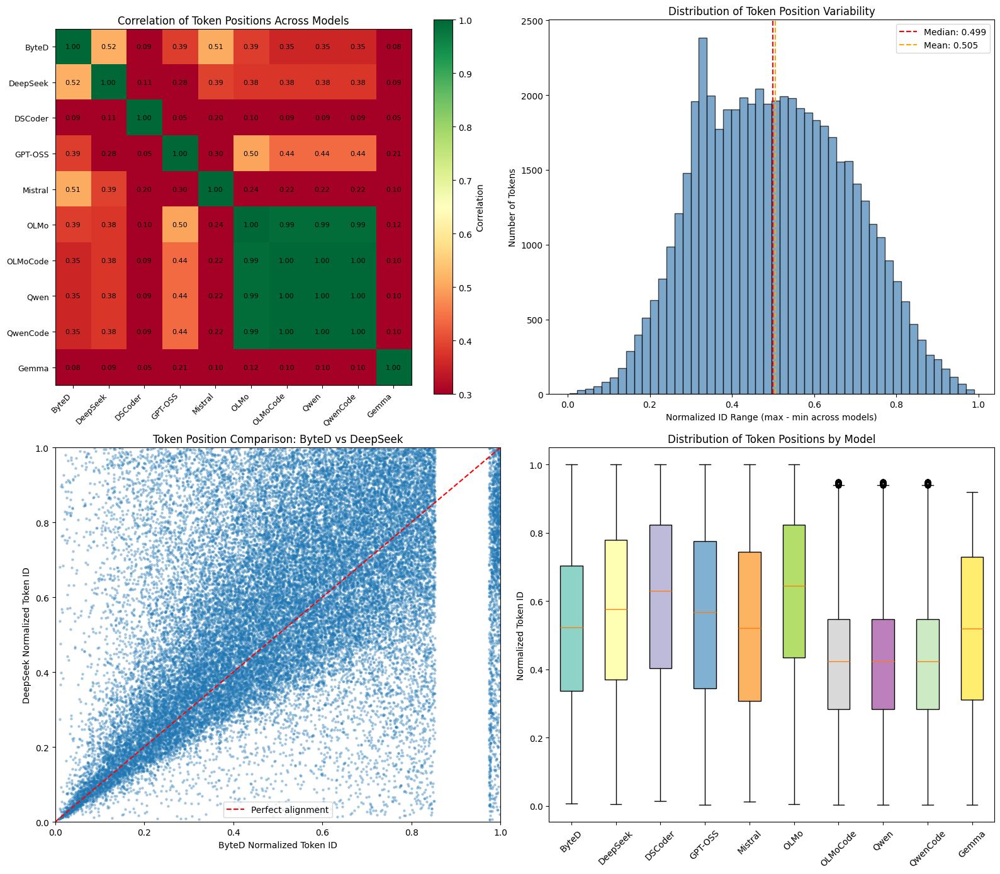


Chart saved to charts\token_position_consistency.png


In [9]:
# Cell 9: Token Position Consistency Analysis

# Get tokens that exist in a majority of models (at least half)
min_models = len(MODEL_ORDER) // 2
tokens_majority = df_sorted[df_sorted['model_count'] >= min_models].copy()

print(f"Analyzing tokens in {min_models}+ models: {len(tokens_majority):,} tokens")

# Extract normalized IDs for correlation analysis
norm_id_cols = [f'{model}_norm_id' for model in MODEL_ORDER]
norm_ids_df = tokens_majority[['normalized_token', 'category'] + norm_id_cols].copy()

# Create 4-panel visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# 1. Correlation heatmap
ax1 = axes[0, 0]
# Only use columns that have data
valid_cols = [col for col in norm_id_cols if norm_ids_df[col].notna().sum() > 100]
if len(valid_cols) > 1:
    corr_matrix = norm_ids_df[valid_cols].corr()
    model_labels = [col.replace('_norm_id', '') for col in valid_cols]
    im = ax1.imshow(corr_matrix, cmap='RdYlGn', vmin=0.3, vmax=1.0)
    ax1.set_xticks(range(len(model_labels)))
    ax1.set_yticks(range(len(model_labels)))
    ax1.set_xticklabels(model_labels, rotation=45, ha='right', fontsize=9)
    ax1.set_yticklabels(model_labels, fontsize=9)
    ax1.set_title('Correlation of Token Positions Across Models', fontsize=12)
    for i in range(len(model_labels)):
        for j in range(len(model_labels)):
            ax1.text(j, i, f'{corr_matrix.iloc[i, j]:.2f}', ha='center', va='center', fontsize=8)
    plt.colorbar(im, ax=ax1, label='Correlation')
else:
    ax1.text(0.5, 0.5, 'Insufficient data for correlation', ha='center', va='center')

# 2. Histogram of norm_id_range (position variability)
ax2 = axes[0, 1]
valid_ranges = tokens_majority['norm_id_range'].dropna()
ax2.hist(valid_ranges, bins=50, edgecolor='black', alpha=0.7, color='steelblue')
ax2.axvline(valid_ranges.median(), color='red', linestyle='--', 
            label=f"Median: {valid_ranges.median():.3f}")
ax2.axvline(valid_ranges.mean(), color='orange', linestyle='--', 
            label=f"Mean: {valid_ranges.mean():.3f}")
ax2.set_xlabel('Normalized ID Range (max - min across models)')
ax2.set_ylabel('Number of Tokens')
ax2.set_title('Distribution of Token Position Variability', fontsize=12)
ax2.legend()

# 3. Scatter plot comparing two models
ax3 = axes[1, 0]
if len(MODEL_ORDER) >= 2:
    model1, model2 = MODEL_ORDER[0], MODEL_ORDER[1]
    col1, col2 = f'{model1}_norm_id', f'{model2}_norm_id'
    valid_pairs = tokens_majority[[col1, col2]].dropna()
    ax3.scatter(valid_pairs[col1], valid_pairs[col2], alpha=0.3, s=5)
    ax3.plot([0, 1], [0, 1], 'r--', label='Perfect alignment')
    ax3.set_xlabel(f'{model1} Normalized Token ID')
    ax3.set_ylabel(f'{model2} Normalized Token ID')
    ax3.set_title(f'Token Position Comparison: {model1} vs {model2}', fontsize=12)
    ax3.legend()
    ax3.set_xlim(0, 1)
    ax3.set_ylim(0, 1)

# 4. Box plots showing distribution per model
ax4 = axes[1, 1]
box_data = []
box_labels = []
for model in MODEL_ORDER:
    col = f'{model}_norm_id'
    data = tokens_majority[col].dropna().values
    if len(data) > 0:
        box_data.append(data)
        box_labels.append(model)

if box_data:
    bp = ax4.boxplot(box_data, labels=box_labels, patch_artist=True)
    colors = plt.cm.Set3(np.linspace(0, 1, len(box_labels)))
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
    ax4.set_ylabel('Normalized Token ID')
    ax4.set_title('Distribution of Token Positions by Model', fontsize=12)
    ax4.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig(CHARTS_DIR / 'token_position_consistency.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nChart saved to {CHARTS_DIR / 'token_position_consistency.png'}")

## Pairwise Model Comparisons

Scatter plots comparing token positions between all model pairs.

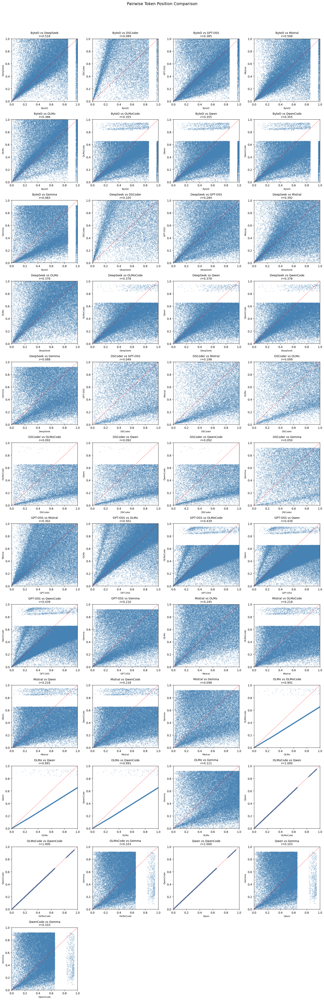

Chart saved to charts\pairwise_comparisons.png


In [10]:
# Cell 10: Pairwise Scatter Plots

# Calculate number of pairs
n_models = len(MODEL_ORDER)
n_pairs = n_models * (n_models - 1) // 2

# Determine grid size
n_cols = 4
n_rows = (n_pairs + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows))
axes = axes.flatten() if n_pairs > 1 else [axes]

pair_idx = 0
for i, model1 in enumerate(MODEL_ORDER):
    for j, model2 in enumerate(MODEL_ORDER):
        if j > i:  # Only upper triangle
            ax = axes[pair_idx]
            col1 = f'{model1}_norm_id'
            col2 = f'{model2}_norm_id'
            
            valid_pairs = tokens_majority[[col1, col2]].dropna()
            
            if len(valid_pairs) > 0:
                ax.scatter(valid_pairs[col1], valid_pairs[col2], 
                          alpha=0.2, s=3, c='steelblue')
                ax.plot([0, 1], [0, 1], 'r--', linewidth=1, alpha=0.7)
                
                # Calculate correlation
                corr = valid_pairs[col1].corr(valid_pairs[col2])
                ax.set_title(f'{model1} vs {model2}\nr={corr:.3f}', fontsize=10)
            else:
                ax.set_title(f'{model1} vs {model2}\nNo data', fontsize=10)
            
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
            ax.set_xlabel(model1, fontsize=8)
            ax.set_ylabel(model2, fontsize=8)
            pair_idx += 1

# Hide unused subplots
for idx in range(pair_idx, len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('Pairwise Token Position Comparison', fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(CHARTS_DIR / 'pairwise_comparisons.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Chart saved to {CHARTS_DIR / 'pairwise_comparisons.png'}")

## Code Token Position Analysis

Pairwise scatter plots comparing token positions specifically for code-related tokens.

Code-related tokens for analysis: 2,498


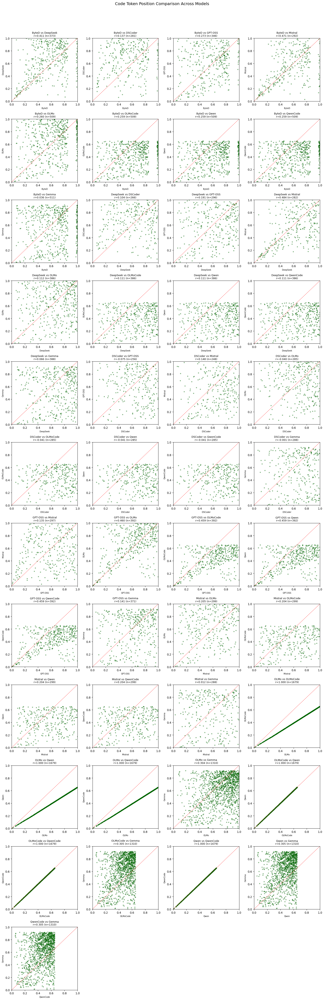


Chart saved to charts\code_token_pairwise.png

CODE TOKEN POSITION STATISTICS
Total code tokens: 2,498
Mean position range: 0.2700
Median position range: 0.2847
Very consistent (range < 0.1): 800 (32.0%)


In [15]:
# Cell: Code Token Pairwise Comparisons

# Filter to code-related tokens only
code_tokens_df = df_sorted[df_sorted['is_code'] == True].copy()
print(f"Code-related tokens for analysis: {len(code_tokens_df):,}")

# Calculate number of pairs
n_models = len(MODEL_ORDER)
n_pairs = n_models * (n_models - 1) // 2

# Determine grid size
n_cols = 4
n_rows = (n_pairs + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows))
axes = axes.flatten() if n_pairs > 1 else [axes]

pair_idx = 0
for i, model1 in enumerate(MODEL_ORDER):
    for j, model2 in enumerate(MODEL_ORDER):
        if j > i:  # Only upper triangle
            ax = axes[pair_idx]
            col1 = f'{model1}_norm_id'
            col2 = f'{model2}_norm_id'
            
            valid_pairs = code_tokens_df[[col1, col2]].dropna()
            
            if len(valid_pairs) > 0:
                ax.scatter(valid_pairs[col1], valid_pairs[col2], 
                          alpha=0.4, s=8, c='darkgreen')
                ax.plot([0, 1], [0, 1], 'r--', linewidth=1, alpha=0.7)
                
                # Calculate correlation
                corr = valid_pairs[col1].corr(valid_pairs[col2])
                ax.set_title(f'{model1} vs {model2}\nr={corr:.3f} (n={len(valid_pairs)})', fontsize=9)
            else:
                ax.set_title(f'{model1} vs {model2}\nNo data', fontsize=9)
            
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
            ax.set_xlabel(model1, fontsize=7)
            ax.set_ylabel(model2, fontsize=7)
            pair_idx += 1

# Hide unused subplots
for idx in range(pair_idx, len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('Code Token Position Comparison Across Models', fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig(CHARTS_DIR / 'code_token_pairwise.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nChart saved to {CHARTS_DIR / 'code_token_pairwise.png'}")

# Show code token statistics
print(f"\n{'='*60}")
print("CODE TOKEN POSITION STATISTICS")
print('='*60)
code_ranges = code_tokens_df['norm_id_range'].dropna()
if len(code_ranges) > 0:
    print(f"Total code tokens: {len(code_tokens_df):,}")
    print(f"Mean position range: {code_ranges.mean():.4f}")
    print(f"Median position range: {code_ranges.median():.4f}")
    consistent = len(code_ranges[code_ranges < 0.1])
    print(f"Very consistent (range < 0.1): {consistent:,} ({consistent/len(code_ranges)*100:.1f}%)")

## JSON Token Position Analysis

Pairwise scatter plots comparing token positions specifically for JSON-related tokens.

JSON-related tokens for analysis: 10


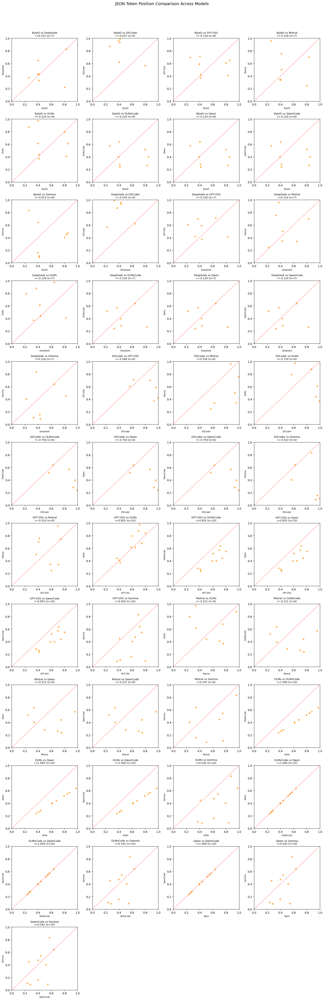


Chart saved to charts\json_token_pairwise.png

JSON TOKEN POSITION STATISTICS
Total JSON tokens: 10
Mean position range: 0.6522
Median position range: 0.6658
Very consistent (range < 0.1): 0 (0.0%)

JSON Tokens Found:
  - 'true' (in 10 models)
  - 'false' (in 10 models)
  - 'null' (in 10 models)
  - 'loads' (in 10 models)
  - 'parse' (in 10 models)
  - 'json' (in 10 models)
  - 'serialize' (in 9 models)
  - 'dumps' (in 7 models)
  - 'deserialize' (in 7 models)
  - 'stringify' (in 6 models)


In [16]:
# Cell: JSON Token Pairwise Comparisons

# Filter to JSON-related tokens only
json_tokens_df = df_sorted[df_sorted['is_json'] == True].copy()
print(f"JSON-related tokens for analysis: {len(json_tokens_df):,}")

if len(json_tokens_df) > 0:
    # Calculate number of pairs
    n_models = len(MODEL_ORDER)
    n_pairs = n_models * (n_models - 1) // 2

    # Determine grid size
    n_cols = 4
    n_rows = (n_pairs + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows))
    axes = axes.flatten() if n_pairs > 1 else [axes]

    pair_idx = 0
    for i, model1 in enumerate(MODEL_ORDER):
        for j, model2 in enumerate(MODEL_ORDER):
            if j > i:  # Only upper triangle
                ax = axes[pair_idx]
                col1 = f'{model1}_norm_id'
                col2 = f'{model2}_norm_id'
                
                valid_pairs = json_tokens_df[[col1, col2]].dropna()
                
                if len(valid_pairs) > 0:
                    ax.scatter(valid_pairs[col1], valid_pairs[col2], 
                              alpha=0.6, s=20, c='darkorange', marker='s')
                    ax.plot([0, 1], [0, 1], 'r--', linewidth=1, alpha=0.7)
                    
                    # Calculate correlation
                    if len(valid_pairs) > 1:
                        corr = valid_pairs[col1].corr(valid_pairs[col2])
                        ax.set_title(f'{model1} vs {model2}\nr={corr:.3f} (n={len(valid_pairs)})', fontsize=9)
                    else:
                        ax.set_title(f'{model1} vs {model2}\nn={len(valid_pairs)}', fontsize=9)
                else:
                    ax.set_title(f'{model1} vs {model2}\nNo data', fontsize=9)
                
                ax.set_xlim(0, 1)
                ax.set_ylim(0, 1)
                ax.set_xlabel(model1, fontsize=7)
                ax.set_ylabel(model2, fontsize=7)
                pair_idx += 1

    # Hide unused subplots
    for idx in range(pair_idx, len(axes)):
        axes[idx].set_visible(False)

    plt.suptitle('JSON Token Position Comparison Across Models', fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig(CHARTS_DIR / 'json_token_pairwise.png', dpi=150, bbox_inches='tight')
    plt.show()

    print(f"\nChart saved to {CHARTS_DIR / 'json_token_pairwise.png'}")
else:
    print("No JSON tokens found for pairwise analysis.")

# Show JSON token statistics
print(f"\n{'='*60}")
print("JSON TOKEN POSITION STATISTICS")
print('='*60)
if len(json_tokens_df) > 0:
    json_ranges = json_tokens_df['norm_id_range'].dropna()
    if len(json_ranges) > 0:
        print(f"Total JSON tokens: {len(json_tokens_df):,}")
        print(f"Mean position range: {json_ranges.mean():.4f}")
        print(f"Median position range: {json_ranges.median():.4f}")
        consistent = len(json_ranges[json_ranges < 0.1])
        print(f"Very consistent (range < 0.1): {consistent:,} ({consistent/len(json_ranges)*100:.1f}%)")
    
    # Show the actual JSON tokens
    print(f"\nJSON Tokens Found:")
    for idx, row in json_tokens_df.head(20).iterrows():
        print(f"  - '{row['normalized_token']}' (in {row['model_count']} models)")
else:
    print("No JSON tokens found in the dataset.")

## General-Purpose Tokenizer Correlation

Correlation analysis of token positions excluding code-specific tokenizers (DSCoder, QwenCode, OLMoCode).

General-purpose tokenizers: ['ByteD', 'DeepSeek', 'GPT-OSS', 'Mistral', 'OLMo', 'Qwen', 'Gemma']
Excluded code-specific tokenizers: ['DSCoder', 'QwenCode', 'OLMoCode']

Tokens in 3+ general-purpose models: 72,073


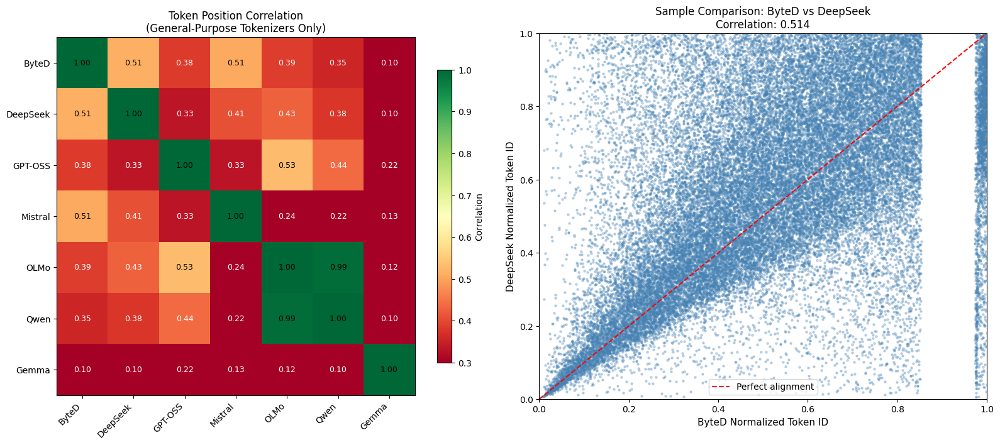


Chart saved to charts\general_tokenizer_correlation.png

CORRELATION SUMMARY (General-Purpose Tokenizers)

Pairwise Correlations:
  ByteD vs DeepSeek: 0.514
  ByteD vs GPT-OSS: 0.383
  ByteD vs Mistral: 0.506
  ByteD vs OLMo: 0.386
  ByteD vs Qwen: 0.355
  ByteD vs Gemma: 0.096
  DeepSeek vs GPT-OSS: 0.333
  DeepSeek vs Mistral: 0.408
  DeepSeek vs OLMo: 0.426
  DeepSeek vs Qwen: 0.378
  DeepSeek vs Gemma: 0.102
  GPT-OSS vs Mistral: 0.331
  GPT-OSS vs OLMo: 0.532
  GPT-OSS vs Qwen: 0.439
  GPT-OSS vs Gemma: 0.217
  Mistral vs OLMo: 0.245
  Mistral vs Qwen: 0.218
  Mistral vs Gemma: 0.131
  OLMo vs Qwen: 0.991
  OLMo vs Gemma: 0.121
  Qwen vs Gemma: 0.103

Overall Statistics:
  Mean correlation: 0.344
  Min correlation:  0.096
  Max correlation:  0.991


In [17]:
# Cell: General-Purpose Tokenizer Correlation (Excluding Code-Specific Models)

# Exclude code-specific tokenizers
CODE_SPECIFIC_MODELS = ['DSCoder', 'QwenCode', 'OLMoCode']
GENERAL_MODELS = [m for m in MODEL_ORDER if m not in CODE_SPECIFIC_MODELS]

print(f"General-purpose tokenizers: {GENERAL_MODELS}")
print(f"Excluded code-specific tokenizers: {CODE_SPECIFIC_MODELS}")

# Get tokens that exist in at least half of the general-purpose models
min_general_models = len(GENERAL_MODELS) // 2
general_norm_id_cols = [f'{model}_norm_id' for model in GENERAL_MODELS]

# Filter to tokens present in at least one general-purpose model
general_tokens_mask = df_sorted[general_norm_id_cols].notna().sum(axis=1) >= min_general_models
general_tokens_df = df_sorted[general_tokens_mask].copy()

print(f"\nTokens in {min_general_models}+ general-purpose models: {len(general_tokens_df):,}")

# Create correlation heatmap
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# 1. Correlation heatmap for general-purpose tokenizers
ax1 = axes[0]
valid_cols = [col for col in general_norm_id_cols if general_tokens_df[col].notna().sum() > 100]

if len(valid_cols) > 1:
    corr_matrix = general_tokens_df[valid_cols].corr()
    model_labels = [col.replace('_norm_id', '') for col in valid_cols]
    
    im = ax1.imshow(corr_matrix, cmap='RdYlGn', vmin=0.3, vmax=1.0)
    ax1.set_xticks(range(len(model_labels)))
    ax1.set_yticks(range(len(model_labels)))
    ax1.set_xticklabels(model_labels, rotation=45, ha='right', fontsize=10)
    ax1.set_yticklabels(model_labels, fontsize=10)
    ax1.set_title('Token Position Correlation\n(General-Purpose Tokenizers Only)', fontsize=12)
    
    # Add correlation values
    for i in range(len(model_labels)):
        for j in range(len(model_labels)):
            val = corr_matrix.iloc[i, j]
            text_color = 'white' if val < 0.5 else 'black'
            ax1.text(j, i, f'{val:.2f}', ha='center', va='center', fontsize=9, color=text_color)
    
    plt.colorbar(im, ax=ax1, label='Correlation', shrink=0.8)
else:
    ax1.text(0.5, 0.5, 'Insufficient data for correlation', ha='center', va='center')

# 2. Pairwise scatter comparison for a sample pair
ax2 = axes[1]
if len(GENERAL_MODELS) >= 2:
    # Use first two general models for scatter plot
    model1, model2 = GENERAL_MODELS[0], GENERAL_MODELS[1]
    col1, col2 = f'{model1}_norm_id', f'{model2}_norm_id'
    
    valid_pairs = general_tokens_df[[col1, col2]].dropna()
    
    if len(valid_pairs) > 0:
        ax2.scatter(valid_pairs[col1], valid_pairs[col2], alpha=0.3, s=5, c='steelblue')
        ax2.plot([0, 1], [0, 1], 'r--', linewidth=1.5, label='Perfect alignment')
        
        corr = valid_pairs[col1].corr(valid_pairs[col2])
        ax2.set_xlabel(f'{model1} Normalized Token ID', fontsize=11)
        ax2.set_ylabel(f'{model2} Normalized Token ID', fontsize=11)
        ax2.set_title(f'Sample Comparison: {model1} vs {model2}\nCorrelation: {corr:.3f}', fontsize=12)
        ax2.legend()
        ax2.set_xlim(0, 1)
        ax2.set_ylim(0, 1)

plt.tight_layout()
plt.savefig(CHARTS_DIR / 'general_tokenizer_correlation.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nChart saved to {CHARTS_DIR / 'general_tokenizer_correlation.png'}")

# Print correlation summary
print(f"\n{'='*70}")
print("CORRELATION SUMMARY (General-Purpose Tokenizers)")
print('='*70)

if len(valid_cols) > 1:
    # Get average pairwise correlation
    corr_values = []
    print("\nPairwise Correlations:")
    for i, m1 in enumerate(model_labels):
        for j, m2 in enumerate(model_labels):
            if j > i:
                corr_val = corr_matrix.iloc[i, j]
                corr_values.append(corr_val)
                print(f"  {m1} vs {m2}: {corr_val:.3f}")
    
    print(f"\nOverall Statistics:")
    print(f"  Mean correlation: {np.mean(corr_values):.3f}")
    print(f"  Min correlation:  {np.min(corr_values):.3f}")
    print(f"  Max correlation:  {np.max(corr_values):.3f}")

## Correlation on Common Tokens Only

Analyze token position correlation using only tokens that are common across ALL general-purpose models, and separately for the top 3 most correlated model pairs.

In [ ]:
# Cell: Correlation Analysis on Common Tokens

# === Part 1: Tokens common to ALL general-purpose models ===
print("=" * 80)
print("PART 1: TOKENS COMMON TO ALL GENERAL-PURPOSE MODELS")
print("=" * 80)

# Filter to tokens present in ALL general-purpose models
all_general_mask = df_sorted[general_norm_id_cols].notna().all(axis=1)
all_common_tokens_df = df_sorted[all_general_mask].copy()

print(f"General-purpose models: {GENERAL_MODELS}")
print(f"Tokens common to ALL {len(GENERAL_MODELS)} models: {len(all_common_tokens_df):,}")

# Create correlation heatmap for tokens in all models
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# 1. Correlation heatmap for all-common tokens
ax1 = axes[0]
if len(all_common_tokens_df) > 50:
    corr_all_common = all_common_tokens_df[general_norm_id_cols].corr()
    model_labels_all = [col.replace('_norm_id', '') for col in general_norm_id_cols]
    
    im = ax1.imshow(corr_all_common, cmap='RdYlGn', vmin=0.3, vmax=1.0)
    ax1.set_xticks(range(len(model_labels_all)))
    ax1.set_yticks(range(len(model_labels_all)))
    ax1.set_xticklabels(model_labels_all, rotation=45, ha='right', fontsize=10)
    ax1.set_yticklabels(model_labels_all, fontsize=10)
    ax1.set_title(f'Correlation (Tokens in ALL {len(GENERAL_MODELS)} Models)\nn={len(all_common_tokens_df):,} tokens', fontsize=12)
    
    for i in range(len(model_labels_all)):
        for j in range(len(model_labels_all)):
            val = corr_all_common.iloc[i, j]
            text_color = 'white' if val < 0.5 else 'black'
            ax1.text(j, i, f'{val:.2f}', ha='center', va='center', fontsize=9, color=text_color)
    
    plt.colorbar(im, ax=ax1, label='Correlation', shrink=0.8)
else:
    ax1.text(0.5, 0.5, f'Insufficient common tokens\n({len(all_common_tokens_df)} found)', 
             ha='center', va='center', fontsize=12)
    corr_all_common = None

# 2. Find top 3 most correlated model pairs
ax2 = axes[1]
if len(all_common_tokens_df) > 50 and corr_all_common is not None:
    # Extract pairwise correlations
    pair_correlations = []
    for i, m1 in enumerate(GENERAL_MODELS):
        for j, m2 in enumerate(GENERAL_MODELS):
            if j > i:
                corr_val = corr_all_common.iloc[i, j]
                pair_correlations.append((m1, m2, corr_val))
    
    # Sort by correlation (descending)
    pair_correlations.sort(key=lambda x: x[2], reverse=True)
    
    # Bar chart of all pairwise correlations
    pair_labels = [f'{p[0]}\nvs\n{p[1]}' for p in pair_correlations]
    corr_vals = [p[2] for p in pair_correlations]
    colors = ['green' if i < 3 else 'steelblue' for i in range(len(pair_correlations))]
    
    bars = ax2.bar(range(len(pair_correlations)), corr_vals, color=colors, edgecolor='black')
    ax2.set_xticks(range(len(pair_correlations)))
    ax2.set_xticklabels(pair_labels, fontsize=8)
    ax2.set_ylabel('Correlation')
    ax2.set_title('Pairwise Correlations (Top 3 in Green)', fontsize=12)
    ax2.axhline(y=np.mean(corr_vals), color='red', linestyle='--', label=f'Mean: {np.mean(corr_vals):.3f}')
    ax2.legend()
    ax2.set_ylim(0, 1)
    
    # Store top 3 pairs for next analysis
    TOP_3_PAIRS = pair_correlations[:3]
    print(f"\nTop 3 most correlated model pairs:")
    for rank, (m1, m2, corr) in enumerate(TOP_3_PAIRS, 1):
        print(f"  {rank}. {m1} vs {m2}: r={corr:.4f}")
else:
    ax2.text(0.5, 0.5, 'Insufficient data', ha='center', va='center')
    TOP_3_PAIRS = []

plt.tight_layout()
plt.savefig(CHARTS_DIR / 'common_tokens_correlation.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nChart saved to {CHARTS_DIR / 'common_tokens_correlation.png'}")

# === Part 2: Tokens common to Top 3 most correlated pairs ===
print("\n" + "=" * 80)
print("PART 2: CORRELATION FOR TOP 3 MOST SIMILAR MODEL PAIRS")
print("=" * 80)

if len(TOP_3_PAIRS) >= 3:
    # Get unique models from top 3 pairs
    top3_models = set()
    for m1, m2, _ in TOP_3_PAIRS:
        top3_models.add(m1)
        top3_models.add(m2)
    top3_models = sorted(list(top3_models))
    
    print(f"Models in top 3 pairs: {top3_models}")
    
    # Filter to tokens common in these models
    top3_norm_id_cols = [f'{model}_norm_id' for model in top3_models]
    top3_common_mask = df_sorted[top3_norm_id_cols].notna().all(axis=1)
    top3_common_tokens_df = df_sorted[top3_common_mask].copy()
    
    print(f"Tokens common to top-matching models: {len(top3_common_tokens_df):,}")
    
    # Create visualization
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Scatter plots for each of the top 3 pairs
    for idx, (m1, m2, corr) in enumerate(TOP_3_PAIRS):
        ax = axes[idx]
        col1, col2 = f'{m1}_norm_id', f'{m2}_norm_id'
        
        valid_pairs = top3_common_tokens_df[[col1, col2]].dropna()
        
        if len(valid_pairs) > 0:
            ax.scatter(valid_pairs[col1], valid_pairs[col2], alpha=0.3, s=8, c='darkgreen')
            ax.plot([0, 1], [0, 1], 'r--', linewidth=1.5, label='Perfect alignment')
            
            # Recalculate correlation on this subset
            subset_corr = valid_pairs[col1].corr(valid_pairs[col2])
            ax.set_xlabel(f'{m1} Normalized ID', fontsize=11)
            ax.set_ylabel(f'{m2} Normalized ID', fontsize=11)
            ax.set_title(f'#{idx+1}: {m1} vs {m2}\nr={subset_corr:.4f} (n={len(valid_pairs):,})', fontsize=11)
            ax.legend(loc='lower right')
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
            ax.grid(True, alpha=0.3)
    
    plt.suptitle('Top 3 Most Correlated Model Pairs (Common Tokens)', fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig(CHARTS_DIR / 'top3_pairs_correlation.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"\nChart saved to {CHARTS_DIR / 'top3_pairs_correlation.png'}")
    
    # Summary statistics
    print(f"\n{'='*60}")
    print("SUMMARY: Common Token Analysis")
    print('='*60)
    print(f"Tokens in ALL general models: {len(all_common_tokens_df):,}")
    print(f"Tokens in top-3 pair models:  {len(top3_common_tokens_df):,}")
    
    if len(all_common_tokens_df) > 0:
        avg_range = all_common_tokens_df['norm_id_range'].mean()
        print(f"\nPosition consistency (all-common tokens):")
        print(f"  Mean position range: {avg_range:.4f}")
        consistent = len(all_common_tokens_df[all_common_tokens_df['norm_id_range'] < 0.1])
        print(f"  Very consistent (range < 0.1): {consistent:,} ({consistent/len(all_common_tokens_df)*100:.1f}%)")
else:
    print("Insufficient data for top 3 pairs analysis.")

## Parallel Coordinates Plot

Visualize how each token's position varies across models, colored by consistency.

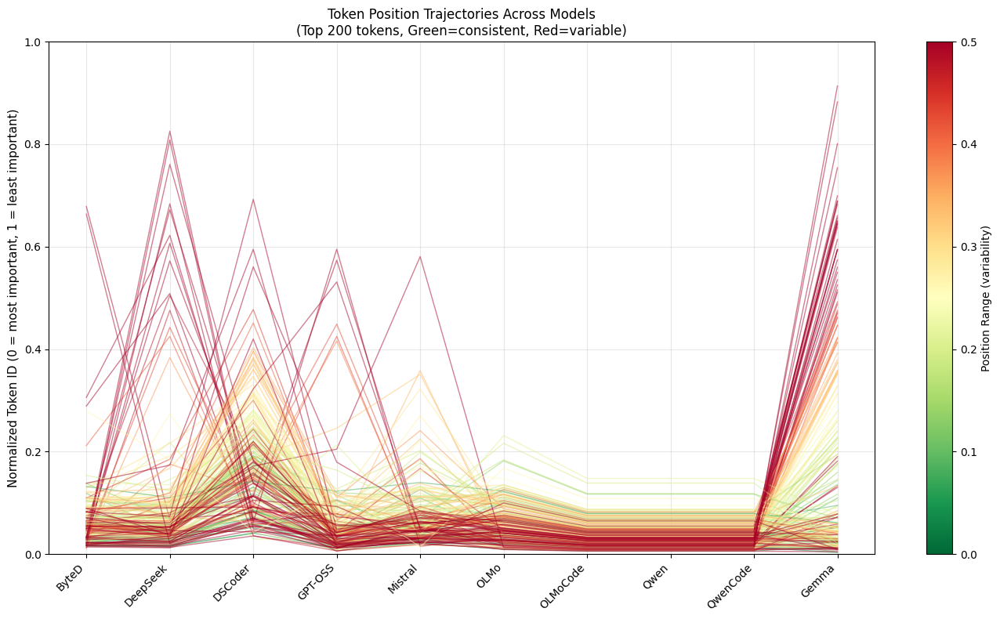


MOST CONSISTENT TOKENS (similar position in all models)
normalized_token category  model_count  avg_norm_id  norm_id_range
            rray  English            5     0.006967       0.003991
            nàng  English            5     0.858348       0.010531
           oogle  English            6     0.018371       0.015718
            khảo  English            5     0.874505       0.015846
           imest  English            5     0.034514       0.016951
           décid  English            5     0.945993       0.017483
           avior  English            5     0.042881       0.020228
              -m  English            8     0.038334       0.022546
      kullanılan  English            5     0.904952       0.023761
        straints  English            5     0.055365       0.026708
              -s  English            8     0.042521       0.028524
             've  English            8     0.030405       0.029658
              -a  English            8     0.057636       0.029962
     

In [11]:
# Cell 11: Parallel Coordinates Plot

# Take top 200 most important tokens for visualization clarity
top_tokens = tokens_majority.head(200).copy()

fig, ax = plt.subplots(figsize=(14, 8))

# Create parallel coordinates
x_positions = np.arange(len(MODEL_ORDER))

# Color by norm_id_range (consistency)
cmap = plt.cm.RdYlGn_r  # Red = variable, Green = consistent
norm = plt.Normalize(0, 0.5)

for idx, row in top_tokens.iterrows():
    y_values = []
    x_valid = []
    for i, model in enumerate(MODEL_ORDER):
        val = row[f'{model}_norm_id']
        if pd.notna(val):
            y_values.append(val)
            x_valid.append(i)
    
    if len(y_values) >= 2:
        range_val = row['norm_id_range'] if pd.notna(row['norm_id_range']) else 0
        color = cmap(norm(range_val))
        ax.plot(x_valid, y_values, alpha=0.5, linewidth=1, color=color)

ax.set_xticks(x_positions)
ax.set_xticklabels(MODEL_ORDER, fontsize=10, rotation=45, ha='right')
ax.set_ylabel('Normalized Token ID (0 = most important, 1 = least important)', fontsize=11)
ax.set_title('Token Position Trajectories Across Models\n(Top 200 tokens, Green=consistent, Red=variable)', fontsize=12)
ax.set_ylim(0, 1)
ax.grid(True, alpha=0.3)

# Add colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Position Range (variability)')

plt.tight_layout()
plt.savefig(CHARTS_DIR / 'parallel_coordinates.png', dpi=150, bbox_inches='tight')
plt.show()

# Show most and least consistent tokens
print("\n" + "=" * 80)
print("MOST CONSISTENT TOKENS (similar position in all models)")
print("=" * 80)
most_consistent = tokens_majority.nsmallest(15, 'norm_id_range')[
    ['normalized_token', 'category', 'model_count', 'avg_norm_id', 'norm_id_range']]
print(most_consistent.to_string(index=False))

print("\n" + "=" * 80)
print("MOST VARIABLE TOKENS (very different positions across models)")
print("=" * 80)
most_variable = tokens_majority.nlargest(15, 'norm_id_range')[
    ['normalized_token', 'category', 'model_count', 'avg_norm_id', 'norm_id_range']]
print(most_variable.to_string(index=False))

## Analysis by Model Count

Compare token characteristics based on how many models contain them.

Tokens in 3+ models: 78,390
  - In 10 models: 12,724
  - In 9 models: 12,999
  - In 8 models: 6,819
  - In 7 models: 4,199
  - In 6 models: 4,661
  - In 5 models: 12,254
  - In 4 models: 11,764
  - In 3 models: 12,970


C:\Users\vinojos\AppData\Local\Temp\ipykernel_42528\2951996121.py:36: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = ax1.boxplot(box_data_by_count, labels=labels_by_count, patch_artist=True)


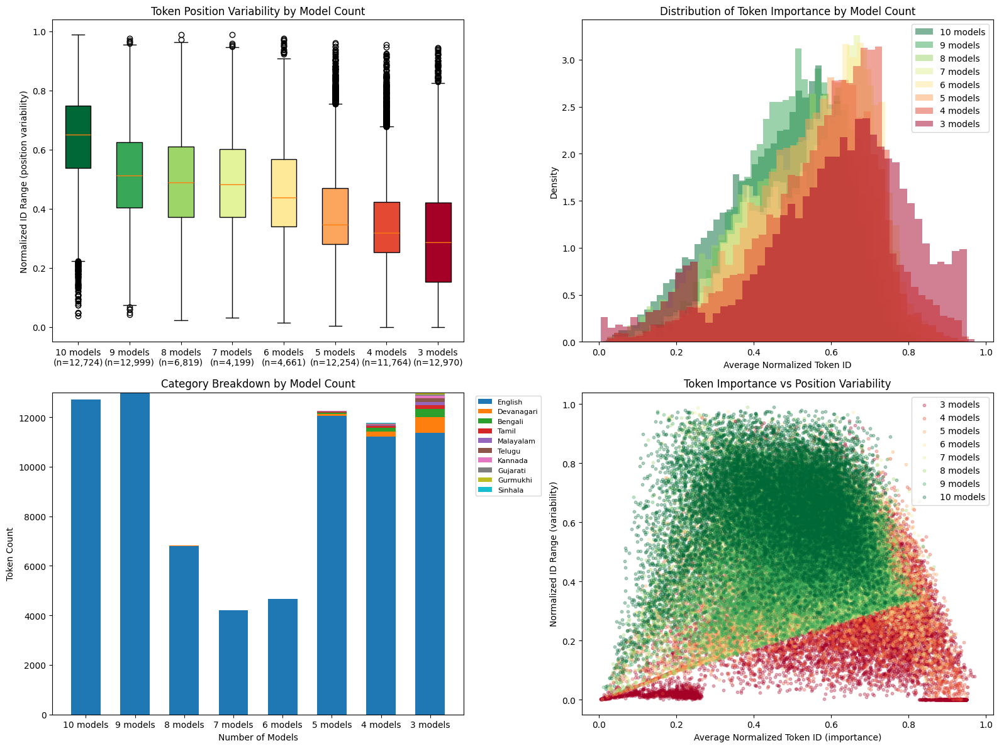


Chart saved to charts\model_count_analysis.png


In [12]:
# Cell 12: Analysis by Model Count

# Filter to tokens in 3+ models
tokens_3plus = df_sorted[df_sorted['model_count'] >= 3].copy()

print(f"Tokens in 3+ models: {len(tokens_3plus):,}")
for count in range(len(MODEL_ORDER), 2, -1):
    subset = tokens_3plus[tokens_3plus['model_count'] == count]
    print(f"  - In {count} models: {len(subset):,}")

# Color scheme for model counts
max_models = len(MODEL_ORDER)
model_count_colors = {}
cmap = plt.cm.RdYlGn
for i, count in enumerate(range(3, max_models + 1)):
    model_count_colors[count] = cmap((count - 3) / (max_models - 3))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Box plot of variability by model count
ax1 = axes[0, 0]
box_data_by_count = []
labels_by_count = []
colors_by_count = []

for count in range(max_models, 2, -1):
    subset = tokens_3plus[tokens_3plus['model_count'] == count]
    if len(subset) > 0:
        ranges = (subset['max_norm_id'] - subset['min_norm_id']).dropna()
        if len(ranges) > 0:
            box_data_by_count.append(ranges.values)
            labels_by_count.append(f'{count} models\n(n={len(subset):,})')
            colors_by_count.append(model_count_colors.get(count, 'gray'))

if box_data_by_count:
    bp1 = ax1.boxplot(box_data_by_count, labels=labels_by_count, patch_artist=True)
    for patch, color in zip(bp1['boxes'], colors_by_count):
        patch.set_facecolor(color)
    ax1.set_ylabel('Normalized ID Range (position variability)')
    ax1.set_title('Token Position Variability by Model Count', fontsize=12)

# 2. Distribution of avg_norm_id by model count
ax2 = axes[0, 1]
for count in range(max_models, 2, -1):
    subset = tokens_3plus[tokens_3plus['model_count'] == count]
    if len(subset) > 0:
        ax2.hist(subset['avg_norm_id'].dropna(), bins=50, alpha=0.5, 
                 label=f'{count} models', color=model_count_colors.get(count, 'gray'), density=True)
ax2.set_xlabel('Average Normalized Token ID')
ax2.set_ylabel('Density')
ax2.set_title('Distribution of Token Importance by Model Count', fontsize=12)
ax2.legend()

# 3. Category breakdown stacked bar chart
ax3 = axes[1, 0]
categories = list(tokens_3plus['category'].unique())
model_counts_list = sorted([c for c in tokens_3plus['model_count'].unique() if c >= 3], reverse=True)

category_data = {}
for cat in categories:
    category_data[cat] = [len(tokens_3plus[(tokens_3plus['model_count'] == c) & 
                                           (tokens_3plus['category'] == cat)]) 
                          for c in model_counts_list]

x = np.arange(len(model_counts_list))
width = 0.6
bottom = np.zeros(len(model_counts_list))

cat_colors = plt.cm.tab10(np.linspace(0, 1, len(categories)))
for i, cat in enumerate(categories):
    ax3.bar(x, category_data[cat], width, label=cat, bottom=bottom, color=cat_colors[i])
    bottom += category_data[cat]

ax3.set_xlabel('Number of Models')
ax3.set_ylabel('Token Count')
ax3.set_title('Category Breakdown by Model Count', fontsize=12)
ax3.set_xticks(x)
ax3.set_xticklabels([f'{c} models' for c in model_counts_list])
ax3.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=8)

# 4. Scatter: Avg norm ID vs Range, colored by model count
ax4 = axes[1, 1]
for count in range(3, max_models + 1):
    subset = tokens_3plus[tokens_3plus['model_count'] == count]
    if len(subset) > 0:
        ax4.scatter(subset['avg_norm_id'], 
                   subset['max_norm_id'] - subset['min_norm_id'], 
                   alpha=0.3, s=10, c=[model_count_colors.get(count, 'gray')], 
                   label=f'{count} models')
ax4.set_xlabel('Average Normalized Token ID (importance)')
ax4.set_ylabel('Normalized ID Range (variability)')
ax4.set_title('Token Importance vs Position Variability', fontsize=12)
ax4.legend()

plt.tight_layout()
plt.savefig(CHARTS_DIR / 'model_count_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nChart saved to {CHARTS_DIR / 'model_count_analysis.png'}")

## Export Results to CSV

In [13]:
# Cell 13: Export Results to CSV

# Prepare output columns in desired order
output_columns = [
    'importance_rank',
    'normalized_token',
    'category',
    'model_count',
    'is_code',
    'is_json'
]

# Add token and token_id columns for each model
for model in MODEL_ORDER:
    output_columns.append(f'{model}_token')
    output_columns.append(f'{model}_token_id')

# Add normalized ID columns for each model
for model in MODEL_ORDER:
    output_columns.append(f'{model}_norm_id')

# Add summary columns
output_columns.extend(['min_norm_id', 'max_norm_id', 'avg_norm_id', 'norm_id_range'])

# Create final DataFrame with available columns
available_cols = [c for c in output_columns if c in df_sorted.columns]
df_output = df_sorted[available_cols].copy()

# Export to CSV
output_path = OUTPUT_DIR / 'token_commonality_analysis.csv'
df_output.to_csv(output_path, index=False, encoding='utf-8-sig')

print(f"Exported {len(df_output):,} tokens to: {output_path}")
print(f"\nColumns in output file ({len(available_cols)}):")
for i, col in enumerate(available_cols, 1):
    print(f"  {i:2}. {col}")

Exported 160,457 tokens to: output\token_commonality_analysis.csv

Columns in output file (40):
   1. importance_rank
   2. normalized_token
   3. category
   4. model_count
   5. is_code
   6. is_json
   7. ByteD_token
   8. ByteD_token_id
   9. DeepSeek_token
  10. DeepSeek_token_id
  11. DSCoder_token
  12. DSCoder_token_id
  13. GPT-OSS_token
  14. GPT-OSS_token_id
  15. Mistral_token
  16. Mistral_token_id
  17. OLMo_token
  18. OLMo_token_id
  19. OLMoCode_token
  20. OLMoCode_token_id
  21. Qwen_token
  22. Qwen_token_id
  23. QwenCode_token
  24. QwenCode_token_id
  25. Gemma_token
  26. Gemma_token_id
  27. ByteD_norm_id
  28. DeepSeek_norm_id
  29. DSCoder_norm_id
  30. GPT-OSS_norm_id
  31. Mistral_norm_id
  32. OLMo_norm_id
  33. OLMoCode_norm_id
  34. Qwen_norm_id
  35. QwenCode_norm_id
  36. Gemma_norm_id
  37. min_norm_id
  38. max_norm_id
  39. avg_norm_id
  40. norm_id_range


## Summary Statistics

In [14]:
# Cell 14: Summary Statistics

print("=" * 80)
print("CROSS-TOKENIZER TOKEN COMMONALITY ANALYSIS - SUMMARY")
print("=" * 80)

print(f"\nTotal unique tokens analyzed: {len(df_output):,}")

print("\n--- Tokens by Model Count ---")
for count in range(len(MODEL_ORDER), 0, -1):
    subset = df_output[df_output['model_count'] == count]
    if len(subset) > 0:
        eng_count = len(subset[subset['category'] == 'English'])
        indic_count = len(subset[subset['category'] != 'English'])
        print(f"  Found in {count} model(s): {len(subset):>8,} tokens ({eng_count:,} English, {indic_count:,} Indic)")

print("\n--- Category Breakdown ---")
for cat in df_output['category'].value_counts().head(15).index:
    count = len(df_output[df_output['category'] == cat])
    pct = count / len(df_output) * 100
    print(f"  {cat:<20}: {count:>8,} ({pct:5.2f}%)")

print("\n--- Code & JSON Token Stats ---")
code_tokens = df_output[df_output['is_code'] == True]
json_tokens = df_output[df_output['is_json'] == True]
print(f"  Code-related tokens: {len(code_tokens):,}")
print(f"  JSON-related tokens: {len(json_tokens):,}")

print("\n--- Vocabulary Sizes ---")
for model, size in vocab_sizes.items():
    print(f"  {model:<12}: {size:>10,} tokens")

print("\n--- Position Consistency (tokens in 3+ models) ---")
tokens_3plus = df_output[df_output['model_count'] >= 3]
ranges = tokens_3plus['norm_id_range'].dropna()
if len(ranges) > 0:
    print(f"  Mean position range:   {ranges.mean():.4f}")
    print(f"  Median position range: {ranges.median():.4f}")
    very_consistent = len(ranges[ranges < 0.1])
    print(f"  Very consistent (range < 0.1): {very_consistent:,} ({very_consistent/len(ranges)*100:.1f}%)")

print(f"\n--- Output Files ---")
print(f"  CSV: {output_path}")
print(f"  Charts: {CHARTS_DIR}/")
for chart in CHARTS_DIR.glob("*.png"):
    print(f"    - {chart.name}")

print("\n" + "=" * 80)
print("Analysis Complete!")
print("=" * 80)

CROSS-TOKENIZER TOKEN COMMONALITY ANALYSIS - SUMMARY

Total unique tokens analyzed: 160,457

--- Tokens by Model Count ---
  Found in 10 model(s):   12,724 tokens (12,724 English, 0 Indic)
  Found in 9 model(s):   12,999 tokens (12,998 English, 1 Indic)
  Found in 8 model(s):    6,819 tokens (6,810 English, 9 Indic)
  Found in 7 model(s):    4,199 tokens (4,199 English, 0 Indic)
  Found in 6 model(s):    4,661 tokens (4,660 English, 1 Indic)
  Found in 5 model(s):   12,254 tokens (12,053 English, 201 Indic)
  Found in 4 model(s):   11,764 tokens (11,226 English, 538 Indic)
  Found in 3 model(s):   12,970 tokens (11,374 English, 1,596 Indic)
  Found in 2 model(s):   19,433 tokens (17,325 English, 2,108 Indic)
  Found in 1 model(s):   62,634 tokens (53,486 English, 9,148 Indic)

--- Category Breakdown ---
  English             :  146,855 (91.52%)
  Devanagari          :    3,902 ( 2.43%)
  Bengali             :    2,087 ( 1.30%)
  Telugu              :    1,685 ( 1.05%)
  Malayalam      